In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import json
import os 
from pprint import pprint

# # graph
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as py

# # contraction mappings
# import sys  
# !{sys.executable} -m pip install contractions
# import contractions

# # tweet preprocessor
# !pip install tweet-preprocessor
# import preprocessor as p

# # tokenizer
import nltk
# nltk.download('punkt')
# from nltk.tokenize import word_tokenize

# stopword
from nltk.corpus import stopwords
nltk.download('stopwords')

# # lemmatizer
# nltk.download('wordnet')
# nltk.download('omw-1.4')
# from nltk.stem import WordNetLemmatizer

# # sentiment analyzer
# nltk.download('vader_lexicon')
# from nltk.sentiment.vader import SentimentIntensityAnalyzer

# wordcloud
from wordcloud import WordCloud

# LDA
import gensim
import gensim.corpora as corpora
from pprint import pprint

# evaluation
from gensim.models import CoherenceModel

# visualization 
!pip install pyLDAvis
import pyLDAvis.gensim_models
import pickle 
import pyLDAvis

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 5.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=1fd2a2ac76b978ecc7a73fd01a239c94b8f2f783ee095259602b2b20c700bb63
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis


/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working



In [ ]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


# Data Understanding 

In [ ]:
# load dataset
df = pd.read_csv('/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx.csv', header=0, engine='c')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
# check number of columns and rows
df.shape

(1909381, 35)

In [ ]:
# get first five rows of the dataset
pd.set_option("display.max_columns", None)
df.head()

,coordinates,created_at,hashtags,media,urls,favorite_count,id,in_reply_to_screen_name,in_reply_to_status_id,in_reply_to_user_id,lang,place,possibly_sensitive,quote_id,retweet_count,retweet_id,retweet_screen_name,source,text,tweet_url,user_created_at,user_id,user_default_profile_image,user_description,user_favourites_count,user_followers_count,user_friends_count,user_listed_count,user_location,user_name,user_screen_name,user_statuses_count,user_time_zone,user_urls,user_verified
0,NaN,Tue Jan 25 04:25:32 +0000 2022,NaN,NaN,NaN,1,1485831178079064064,DavisAndrew88,1.485775e+18,1.462881e+18,en,NaN,NaN,NaN,0,NaN,NaN,"<a href=""http://twitter.com/download/android"" ...",@DavisAndrew88 @aniobrien This is what you wan...,https://twitter.com/TKrebble/status/1485831178...,Fri Jun 08 22:56:37 +0000 2018,1005222093007532034,False,NaN,3499,39,113,2,New Zealand,Thomas Krebble,TKrebble,7990,NaN,NaN,False
1,NaN,Tue Jan 25 04:25:33 +0000 2022,NaN,NaN,https://dreddymd.com/2022/01/23/ivermectin-smu...,0,1485831178607542275,NaN,NaN,NaN,en,NaN,False,NaN,10,1.485588e+18,PingRyan2016,"<a href=""http://twitter.com/download/iphone"" r...",Ivermectin smuggled in chocolate bar saves Bri...,https://twitter.com/Lily04471413/status/148583...,Tue Jul 07 02:32:25 +0000 2020,1280328378516508672,False,"TAKE DOWN THE CCP, FIGHT FOR FREEDOM",4180,437,307,2,NaN,Lily （澳喜特战旅）,Lily04471413,117279,NaN,NaN,False
2,NaN,Tue Jan 25 04:25:32 +0000 2022,NaN,NaN,NaN,1,1485831177802067970,NaN,NaN,NaN,en,NaN,NaN,NaN,0,NaN,NaN,"<a href=""http://twitter.com/download/iphone"" r...",Sitting here telling my brother about all the ...,https://twitter.com/Mellyonfire/status/1485831...,Fri Feb 04 18:15:39 +0000 2011,247394984,False,Strength is what we gain from the madness we s...,9136,85,350,0,Gotham City,Melly P.,Mellyonfire,18549,NaN,NaN,False
3,NaN,Tue Jan 25 04:25:31 +0000 2022,NaN,NaN,NaN,0,1485831172433321985,NaN,NaN,NaN,en,NaN,NaN,1.485358e+18,1898,1.485681e+18,DrAseemMalhotra,"<a href=""http://twitter.com/download/iphone"" r...",When one of the most respected medical journal...,https://twitter.com/SusanMorgan19/status/14858...,Tue Feb 21 18:57:08 +0000 2012,499070954,False,British Medical Laser consultant(before #mesh ...,56518,1673,1440,69,Devon,redress means respect 🩸,SusanMorgan19,30480,NaN,https://youtu.be/ht3u39klo0w,False
4,NaN,Tue Jan 25 04:25:31 +0000 2022,NaN,NaN,https://twitter.com/NathanStall/status/1485766...,1,1485831173737795585,NaN,NaN,NaN,en,NaN,False,1.485767e+18,0,NaN,NaN,"<a href=""https://mobile.twitter.com"" rel=""nofo...",🇨🇦It's -18 degrees where I am right now. My fu...,https://twitter.com/Northerndrums/status/14858...,Tue Oct 25 15:58:03 +0000 2016,790945526745337856,False,"Loved my Briards,Shannieman and Raffie. Love m...",0,1046,1214,8,"Niagara, Ontario",Karol Grant,Northerndrums,48551,NaN,NaN,False


In [ ]:
# check data type of each column
df.dtypes

coordinates                    object
created_at                     object
hashtags                       object
media                          object
urls                           object
favorite_count                  int64
id                              int64
in_reply_to_screen_name        object
in_reply_to_status_id         float64
in_reply_to_user_id           float64
lang                           object
place                          object
possibly_sensitive             object
quote_id                      float64
retweet_count                   int64
retweet_id                    float64
retweet_screen_name            object
source                         object
text                           object
tweet_url                      object
user_created_at                object
user_id                         int64
user_default_profile_image       bool
user_description               object
user_favourites_count           int64
user_followers_count            int64
user_friends

In [ ]:
# drop the unnecessary columns
columns_to_drop = ['coordinates','media','urls','id','in_reply_to_screen_name','in_reply_to_status_id','in_reply_to_user_id','lang','place','possibly_sensitive','quote_id',
                   'retweet_id','retweet_screen_name','source','tweet_url','user_created_at','user_id','user_default_profile_image',
                   'user_description','user_favourites_count','user_followers_count','user_friends_count','user_listed_count','user_location',
                   'user_name','user_screen_name','user_statuses_count','user_time_zone','user_urls','user_verified']
tweets_df = df.drop(columns_to_drop,axis=1)
tweets_df

,created_at,hashtags,favorite_count,retweet_count,text
0,Tue Jan 25 04:25:32 +0000 2022,NaN,1,0,@DavisAndrew88 @aniobrien This is what you wan...
1,Tue Jan 25 04:25:33 +0000 2022,NaN,0,10,Ivermectin smuggled in chocolate bar saves Bri...
2,Tue Jan 25 04:25:32 +0000 2022,NaN,1,0,Sitting here telling my brother about all the ...
3,Tue Jan 25 04:25:31 +0000 2022,NaN,0,1898,When one of the most respected medical journal...
4,Tue Jan 25 04:25:31 +0000 2022,NaN,1,0,🇨🇦It's -18 degrees where I am right now. My fu...
...,...,...,...,...,...
1909376,Wed Jan 26 04:25:09 +0000 2022,NaN,0,6677,"Dear All, \n\nDespite all precautions, I have ..."
1909377,Wed Jan 26 04:25:08 +0000 2022,NaN,0,2149,I've been critical about a lot of the coronavi...
1909378,Wed Jan 26 04:25:10 +0000 2022,NaN,0,6477,Giants come in all sizes. https://t.co/ACsTKIbfDs
1909379,Wed Jan 26 04:25:09 +0000 2022,NaN,0,221,Regeneron itself already acknowledged that its...


In [ ]:
# check for null value for each column
tweets_df.isnull().sum()

created_at              0
hashtags          1701295
favorite_count          0
retweet_count           0
text                    0
dtype: int64

In [ ]:
# calculate statistical data of favorite count and retweet count
tweets_df.describe()

,favorite_count,retweet_count
count,1.909381e+06,1.909381e+06
mean,3.583074e+00,1.281960e+03
std,1.624483e+02,3.770028e+03
min,0.000000e+00,0.000000e+00
25%,0.000000e+00,0.000000e+00
50%,0.000000e+00,3.200000e+01
75%,0.000000e+00,7.220000e+02
max,7.832500e+04,7.468580e+05


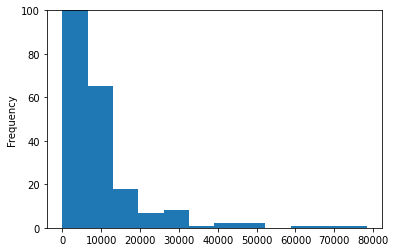

In [ ]:
# plot the distribution of favorite count
tweets_df['favorite_count'].plot.hist(bins=12,ylim=(0,100))

In [ ]:
pd.set_option('display.max_rows', None) 
tweets_df['favorite_count'].value_counts().sort_index()

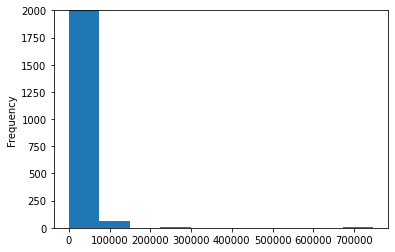

In [ ]:
# plot the distribution of retweet count
tweets_df['retweet_count'].plot.hist(bins=10,ylim=(0,2000))

In [ ]:
tweets_df['retweet_count'].value_counts().sort_index()

In [ ]:
pd.set_option('display.max_colwidth', -1)
tweets_df['text'].head(100)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  """Entry point for launching an IPython kernel.


0     @DavisAndrew88 @aniobrien This is what you want isn't it? Let covid-19 do what it needs to?                                                                                                                                                                                                  
1     Ivermectin smuggled in chocolate bar saves British Covid patient’s life – Dr. Eddy Bettermann MD https://t.co/Pxh6LvVZWB                                                                                                                                                                     
2     Sitting here telling my brother about all the things I’ve done in my life and I have to sit back, like yeah I had a good life. I did a lot of things that a lot of kids now can do. I’m grateful. sucks that they can’t enjoy life correctly. damn pandemic                                  
3     When one of the most respected medical journals in the world goes strong on asking Pfizer to release raw data on the v

In [ ]:
# pickle the dataframe
tweets_df.to_pickle('/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx.pkl')

# Data Preparation

In [ ]:
# load pickled dataframe 
tweets_df = pd.read_pickle('/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx.pkl')

Noise Removal

In [ ]:
# replace line break with space
tweets_df['text'] = tweets_df['text'].apply(lambda x:x.replace('\n',' '))
pd.set_option('display.max_colwidth', -1)
tweets_df['text'].head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  This is separate from the ipykernel package so we can avoid doing imports until


0    @DavisAndrew88 @aniobrien This is what you want isn't it? Let covid-19 do what it needs to?                                                                                                                                                                                                  
1    Ivermectin smuggled in chocolate bar saves British Covid patient’s life – Dr. Eddy Bettermann MD https://t.co/Pxh6LvVZWB                                                                                                                                                                     
2    Sitting here telling my brother about all the things I’ve done in my life and I have to sit back, like yeah I had a good life. I did a lot of things that a lot of kids now can do. I’m grateful. sucks that they can’t enjoy life correctly. damn pandemic                                  
3    When one of the most respected medical journals in the world goes strong on asking Pfizer to release raw data on the vacci

In [ ]:
# replace turkish characters with unicode characters
print(tweets_df['text'].iloc[748616])
translationTable = str.maketrans("ğĞıİöÖüÜşŞçÇ", "gGiIoOuUsScC")
tweets_df['text'] = tweets_df['text'].apply(lambda x: str(x).translate(translationTable))
print(tweets_df['text'].iloc[748616])

The whitepaper "COVID-19 and Technology Adoption in Small and Medium-Sized Enterprises: The Impact and the Way Forward", prepared by the World Economic Forum and contributed by TÜBİTAK BİLGEM as well has been published. https://t.co/bLtQnJKv4j https://t.co/W8PJtaXmtC
The whitepaper "COVID-19 and Technology Adoption in Small and Medium-Sized Enterprises: The Impact and the Way Forward", prepared by the World Economic Forum and contributed by TUBITAK BILGEM as well has been published. https://t.co/bLtQnJKv4j https://t.co/W8PJtaXmtC


In [ ]:
# contraction mapping
def replace_contraction(text):
    text = text.split()
    mapped_text = [contractions.fix(w) for w in text]
    return ' '.join(mapped_text)
tweets_df['text'] = tweets_df['text'].apply(lambda x:replace_contraction(x))
pd.set_option('display.max_colwidth', -1)
tweets_df['text'].head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  import sys


0    @DavisAndrew88 @aniobrien This is what you want is not it? Let covid-19 do what it needs to?                                                                                                                                                                                                   
1    Ivermectin smuggled in chocolate bar saves British Covid patient’s life – Dr. Eddy Bettermann MD https://t.co/Pxh6LvVZWB                                                                                                                                                                       
2    Sitting here telling my brother about all the things I have done in my life and I have to sit back, like yeah I had a good life. I did a lot of things that a lot of kids now can do. I am grateful. sucks that they cannot enjoy life correctly. damn pandemic                                
3    When one of the most respected medical journals in the world goes strong on asking Pfizer to release raw data on the

In [ ]:
# clean the urls, menions, hashtags, emojis, and smileys using tweet-preprocessor package
tweets_df['text'] = tweets_df['text'].apply(lambda x:p.clean(x))
pd.set_option('display.max_colwidth', -1)
tweets_df['text'].head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  This is separate from the ipykernel package so we can avoid doing imports until


0    This is what you want is not it? Let covid-19 do what it needs to?                                                                                                                                                                                                     
1    Ivermectin smuggled in chocolate bar saves British Covid patients life Dr. Eddy Bettermann MD                                                                                                                                                                          
2    Sitting here telling my brother about all the things I have done in my life and I have to sit back, like yeah I had a good life. I did a lot of things that a lot of kids now can do. I am grateful. sucks that they cannot enjoy life correctly. damn pandemic        
3    When one of the most respected medical journals in the world goes strong on asking Pfizer to release raw data on the vaccine having previously exposed suggestions of fraud from a whistlebl

In [ ]:
# remove punctuations
import re
def remove_punctuation(text):
  text = re.sub(r'[^\w\s]', '', text)
  return text
tweets_df['text'] = tweets_df['text'].apply(lambda x:remove_punctuation(x))
pd.set_option('display.max_colwidth', -1)
tweets_df['text'].head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  import sys


0    This is what you want is not it Let covid19 do what it needs to                                                                                                                                                                                                      
1    Ivermectin smuggled in chocolate bar saves British Covid patients life Dr Eddy Bettermann MD                                                                                                                                                                         
2    Sitting here telling my brother about all the things I have done in my life and I have to sit back like yeah I had a good life I did a lot of things that a lot of kids now can do I am grateful sucks that they cannot enjoy life correctly damn pandemic           
3    When one of the most respected medical journals in the world goes strong on asking Pfizer to release raw data on the vaccine having previously exposed suggestions of fraud from a whistleblower a

In [ ]:
# remove digits
def remove_digit(text):
  text=re.sub(r'[0-9]+', '', text)
  return text 
tweets_df['text'] = tweets_df['text'].apply(lambda x:remove_digit(x))
pd.set_option('display.max_colwidth', -1)
tweets_df['text'].head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


0    This is what you want is not it Let covid do what it needs to                                                                                                                                                                                                        
1    Ivermectin smuggled in chocolate bar saves British Covid patients life Dr Eddy Bettermann MD                                                                                                                                                                         
2    Sitting here telling my brother about all the things I have done in my life and I have to sit back like yeah I had a good life I did a lot of things that a lot of kids now can do I am grateful sucks that they cannot enjoy life correctly damn pandemic           
3    When one of the most respected medical journals in the world goes strong on asking Pfizer to release raw data on the vaccine having previously exposed suggestions of fraud from a whistleblower a

In [ ]:
# remove emoticon
print(tweets_df['text'].iloc[1303731]) 
#HappyEmoticons
emoticons_happy = set([
    ':-)', ':)', ';)', ':o)', ':]', ':3', ':c)', ':>', '=]', '8)', '=)', ':}',
    ':^)', ':-D', ':D', '8-D', '8D', 'x-D', 'xD', 'X-D', 'XD', '=-D', '=D',
    '=-3', '=3', ':-))', ":'-)", ":')", ':*', ':^*', '>:P', ':-P', ':P', 'X-P',
    'x-p', 'xp', 'XP', ':-p', ':p', '=p', ':-b', ':b', '>:)', '>;)', '>:-)',
    '<3'
    ])
# Sad Emoticons
emoticons_sad = set([
    ':L', ':-/', '>:/', ':S', '>:[', ':@', ':-(', ':[', ':-||', '=L', ':<',
    ':-[', ':-<', '=\\', '=/', '>:(', ':(', '>.<', ":'-(", ":'(", ':\\', ':-c',
    ':c', ':{', '>:\\', ';('
    ])
emoticons = emoticons_happy.union(emoticons_sad)
def remove_emoticon(text):
  text = text.split()
  filtered_text = [w for w in text if w not in emoticons]
  return ' '.join(filtered_text)
tweets_df['text'] = tweets_df['text'].apply(lambda x:remove_emoticon(x))
pd.set_option('display.max_colwidth', -1)
print(tweets_df['text'].iloc[1303731])

fuck knows but we are not all white supremacists because we do not want a fucking vaccine xD Get a grip man
fuck knows but we are not all white supremacists because we do not want a fucking vaccine Get a grip man


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.


In [ ]:
# replace underscore with space
print(tweets_df['text'].iloc[11794]) 
tweets_df['text'] = tweets_df['text'].apply(lambda x:x.replace('_',' '))
pd.set_option('display.max_colwidth', -1)
print(tweets_df['text'].iloc[11794])

Canada Convoy trucks coming from Georgia USA This is not about vaccine status _____________________ This is about FREEDOM _____________________ Be inspired
Canada Convoy trucks coming from Georgia USA This is not about vaccine status                       This is about FREEDOM                       Be inspired


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  after removing the cwd from sys.path.


In [ ]:
# pickle the cleaned dataframe
tweets_df.to_pickle('/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx_cleaned.pkl')

In [ ]:
#### SEARCHING TOOL
tweets_df = pd.read_pickle('/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx_cleaned.pkl')
df = tweets_df[tweets_df['text'].str.contains('_')]
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', -1)
df['text']
# tweets_df['text'].iloc[1:100]

Tokenization

In [ ]:
# read pickled dataframe
tweets_df = pd.read_pickle('/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx_cleaned.pkl')

In [ ]:
# tokenize the text
tweets_df['text'] = tweets_df['text'].apply(lambda x:word_tokenize(x))
pd.set_option('display.max_colwidth', -1)
tweets_df['text'].head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  This is separate from the ipykernel package so we can avoid doing imports until


0    [This, is, what, you, want, is, not, it, Let, covid, do, what, it, needs, to]                                                                                                                                                                                                                                         
1    [Ivermectin, smuggled, in, chocolate, bar, saves, British, Covid, patients, life, Dr, Eddy, Bettermann, MD]                                                                                                                                                                                                           
2    [Sitting, here, telling, my, brother, about, all, the, things, I, have, done, in, my, life, and, I, have, to, sit, back, like, yeah, I, had, a, good, life, I, did, a, lot, of, things, that, a, lot, of, kids, now, can, do, I, am, grateful, sucks, that, they, can, not, enjoy, life, correctly, damn, pandemic]   
3    [When, one, of, the, most, respected, medical, 

Normalization

In [ ]:
# lowercase the text 
tweets_df['text'] = tweets_df['text'].apply(lambda x:[w.lower() for w in x])
pd.set_option('display.max_colwidth', -1)
tweets_df['text'].head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  This is separate from the ipykernel package so we can avoid doing imports until


0    [this, is, what, you, want, is, not, it, let, covid, do, what, it, needs, to]                                                                                                                                                                                                                                         
1    [ivermectin, smuggled, in, chocolate, bar, saves, british, covid, patients, life, dr, eddy, bettermann, md]                                                                                                                                                                                                           
2    [sitting, here, telling, my, brother, about, all, the, things, i, have, done, in, my, life, and, i, have, to, sit, back, like, yeah, i, had, a, good, life, i, did, a, lot, of, things, that, a, lot, of, kids, now, can, do, i, am, grateful, sucks, that, they, can, not, enjoy, life, correctly, damn, pandemic]   
3    [when, one, of, the, most, respected, medical, 

In [ ]:
# remove stop word
stop_words = set(stopwords.words('english'))
tweets_df['text'] = tweets_df['text'].apply(lambda x: [w for w in x if w not in stop_words])
pd.set_option('display.max_colwidth', -1)
tweets_df['text'].head(10)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


0    [want, let, covid, needs]                                                                                                                                                                                  
1    [ivermectin, smuggled, chocolate, bar, saves, british, covid, patients, life, dr, eddy, bettermann, md]                                                                                                    
2    [sitting, telling, brother, things, done, life, sit, back, like, yeah, good, life, lot, things, lot, kids, grateful, sucks, enjoy, life, correctly, damn, pandemic]                                        
3    [one, respected, medical, journals, world, goes, strong, asking, pfizer, release, raw, data, vaccine, previously, exposed, suggestions, fraud, whistleblower, msm, reported, either, time, wake, fgs, wake]
4    [degrees, right, furnace, cranked, right, heating, bill, natural, gasfor, month, higher, month, last, years, lot, filled, car, morning, gas, litrehigher, ever]

In [ ]:
# lemmatization
lemmatizer = WordNetLemmatizer()
tweets_df['text'] = tweets_df['text'].apply(lambda x: [lemmatizer.lemmatize(w) for w in x])
pd.set_option('display.max_colwidth', -1)
tweets_df['text'].head(10)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  import sys


0    [want, let, covid, need]                                                                                                                                                                               
1    [ivermectin, smuggled, chocolate, bar, save, british, covid, patient, life, dr, eddy, bettermann, md]                                                                                                  
2    [sitting, telling, brother, thing, done, life, sit, back, like, yeah, good, life, lot, thing, lot, kid, grateful, suck, enjoy, life, correctly, damn, pandemic]                                        
3    [one, respected, medical, journal, world, go, strong, asking, pfizer, release, raw, data, vaccine, previously, exposed, suggestion, fraud, whistleblower, msm, reported, either, time, wake, fgs, wake]
4    [degree, right, furnace, cranked, right, heating, bill, natural, gasfor, month, higher, month, last, year, lot, filled, car, morning, gas, litrehigher, ever]                  

In [ ]:
# pickle the preprocessed dataframe
tweets_df.to_pickle('/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx_preprocessed.pkl')

# Explorative Analysis

Derive sentiment and length variable

In [ ]:
cleaned_tweets = pd.read_pickle("/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx_cleaned.pkl")
cleaned_tweets.head()

,created_at,hashtags,favorite_count,retweet_count,text
0,Tue Jan 25 04:25:32 +0000 2022,NaN,1,0,This is what you want is not it Let covid do w...
1,Tue Jan 25 04:25:33 +0000 2022,NaN,0,10,Ivermectin smuggled in chocolate bar saves Bri...
2,Tue Jan 25 04:25:32 +0000 2022,NaN,1,0,Sitting here telling my brother about all the ...
3,Tue Jan 25 04:25:31 +0000 2022,NaN,0,1898,When one of the most respected medical journal...
4,Tue Jan 25 04:25:31 +0000 2022,NaN,1,0,It is degrees where I am right now My furnace ...


In [ ]:
# analyze the sentiment of the tweet
sia = SentimentIntensityAnalyzer()
def analyze_sentiment(text):
  text = str(text)
  analysis = sia.polarity_scores(text.lower())
  if (analysis['compound'] >= 0.05):
    return 1
  elif (analysis['compound'] <= 0.05):
    return -1
  else:
    return 0
cleaned_tweets['sentiment'] = cleaned_tweets['text'].apply(lambda x: analyze_sentiment(x))
pd.set_option('display.max_colwidth', -1)
cleaned_tweets[['text','sentiment']].head(10)

,text,sentiment
0,This is what you want is not it Let covid do what it needs to,1
1,Ivermectin smuggled in chocolate bar saves British Covid patients life Dr Eddy Bettermann MD,-1
2,Sitting here telling my brother about all the things I have done in my life and I have to sit back like yeah I had a good life I did a lot of things that a lot of kids now can do I am grateful sucks that they cannot enjoy life correctly damn pandemic,1
3,When one of the most respected medical journals in the world goes strong on asking Pfizer to release raw data on the vaccine having previously exposed suggestions of fraud from a whistleblower and MSM has not reported on either it is time to WAKE UP FGS WAKE UP,1
4,It is degrees where I am right now My furnace is cranked right up My heating bill natural gasfor this month is higher than any month in the last years by a lot I filled my car this morning with gas at a litrehigher than I can ever,1
5,As the novel virus began to burn its way through the YOUS in early and the race to develop vaccines was on patients who became symptomatic were told to go home take Tylenol and only return to the hospital when they could no longer breathe Why,1
6,Hospital trick patients admitted with covid in days become postcovid amp no longer counted as hospitalized covid patients ICU is full of postcovid patients that are here for amp more days Not counted in the official stats,-1
7,Congratulations to and the handful of Conservative MPs who are jumping on the bandwagon and finally denouncing Trudeaus authoritarian measures after two years of complete silence Hope to see you next weekend in Ottawa,1
8,D Bored Ape Pixel Sold Give appreciation for Proceeds from this sale will be donated to COVID,1
9,KNs are not necessary to protect healthy children because of the exceedingly low risk COVID presents to them The risks of improper use prolonged wearing and impaired aeration outweigh any potential benefit,-1


In [ ]:
raw_tweets = pd.read_pickle("/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx.pkl")

In [ ]:
# calculate the length of tweets
cleaned_tweets['length'] = raw_tweets['text'].apply(len)
pd.set_option('display.max_colwidth', -1)
cleaned_tweets[['text','length']].head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


,text,length
0,This is what you want is not it Let covid do what it needs to,91
1,Ivermectin smuggled in chocolate bar saves British Covid patients life Dr Eddy Bettermann MD,120
2,Sitting here telling my brother about all the things I have done in my life and I have to sit back like yeah I had a good life I did a lot of things that a lot of kids now can do I am grateful sucks that they cannot enjoy life correctly damn pandemic,251
3,When one of the most respected medical journals in the world goes strong on asking Pfizer to release raw data on the vaccine having previously exposed suggestions of fraud from a whistleblower and MSM has not reported on either it is time to WAKE UP FGS WAKE UP,285
4,It is degrees where I am right now My furnace is cranked right up My heating bill natural gasfor this month is higher than any month in the last years by a lot I filled my car this morning with gas at a litrehigher than I can ever,274
5,As the novel virus began to burn its way through the YOUS in early and the race to develop vaccines was on patients who became symptomatic were told to go home take Tylenol and only return to the hospital when they could no longer breathe Why,278
6,Hospital trick patients admitted with covid in days become postcovid amp no longer counted as hospitalized covid patients ICU is full of postcovid patients that are here for amp more days Not counted in the official stats,248
7,Congratulations to and the handful of Conservative MPs who are jumping on the bandwagon and finally denouncing Trudeaus authoritarian measures after two years of complete silence Hope to see you next weekend in Ottawa,280
8,D Bored Ape Pixel Sold Give appreciation for Proceeds from this sale will be donated to COVID,139
9,KNs are not necessary to protect healthy children because of the exceedingly low risk COVID presents to them The risks of improper use prolonged wearing and impaired aeration outweigh any potential benefit,217


In [ ]:
cleaned_tweets.head(10)

,created_at,hashtags,favorite_count,retweet_count,text,sentiment,length
0,Tue Jan 25 04:25:32 +0000 2022,NaN,1,0,This is what you want is not it Let covid do what it needs to,1,91
1,Tue Jan 25 04:25:33 +0000 2022,NaN,0,10,Ivermectin smuggled in chocolate bar saves British Covid patients life Dr Eddy Bettermann MD,-1,120
2,Tue Jan 25 04:25:32 +0000 2022,NaN,1,0,Sitting here telling my brother about all the things I have done in my life and I have to sit back like yeah I had a good life I did a lot of things that a lot of kids now can do I am grateful sucks that they cannot enjoy life correctly damn pandemic,1,251
3,Tue Jan 25 04:25:31 +0000 2022,NaN,0,1898,When one of the most respected medical journals in the world goes strong on asking Pfizer to release raw data on the vaccine having previously exposed suggestions of fraud from a whistleblower and MSM has not reported on either it is time to WAKE UP FGS WAKE UP,1,285
4,Tue Jan 25 04:25:31 +0000 2022,NaN,1,0,It is degrees where I am right now My furnace is cranked right up My heating bill natural gasfor this month is higher than any month in the last years by a lot I filled my car this morning with gas at a litrehigher than I can ever,1,274
5,Tue Jan 25 04:25:31 +0000 2022,NaN,0,482,As the novel virus began to burn its way through the YOUS in early and the race to develop vaccines was on patients who became symptomatic were told to go home take Tylenol and only return to the hospital when they could no longer breathe Why,1,278
6,Tue Jan 25 04:25:31 +0000 2022,NaN,0,13225,Hospital trick patients admitted with covid in days become postcovid amp no longer counted as hospitalized covid patients ICU is full of postcovid patients that are here for amp more days Not counted in the official stats,-1,248
7,Tue Jan 25 04:25:32 +0000 2022,NaN,0,1124,Congratulations to and the handful of Conservative MPs who are jumping on the bandwagon and finally denouncing Trudeaus authoritarian measures after two years of complete silence Hope to see you next weekend in Ottawa,1,280
8,Tue Jan 25 04:25:31 +0000 2022,NaN,6,1,D Bored Ape Pixel Sold Give appreciation for Proceeds from this sale will be donated to COVID,1,139
9,Tue Jan 25 04:25:30 +0000 2022,NaN,0,2921,KNs are not necessary to protect healthy children because of the exceedingly low risk COVID presents to them The risks of improper use prolonged wearing and impaired aeration outweigh any potential benefit,-1,217


In [ ]:
cleaned_tweets.to_pickle("/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx_eda.pkl")

Exploratory Data Analysis

In [ ]:
cleaned_tweets = pd.read_pickle("/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx_eda.pkl")

In [ ]:
# plot donut chart for sentiment count
x = ['Negative','Neutral','Positive']
y = cleaned_tweets['sentiment'].value_counts(ascending=True).sort_index(ascending=True)
total_tweets = len(cleaned_tweets)
sentiment_donut = go.Figure()
sentiment_donut.add_trace(go.Pie(labels=x, values=y))
sentiment_donut.update_traces(marker=dict(colors=['hsl(360, 70%, 60%)', 'hsl(240, 70%, 60%)', 'hsl(120, 70%, 60%)']))
sentiment_donut.update_traces(hole=.4)
sentiment_donut.update_traces(textposition='outside', textinfo='label+value')
sentiment_donut.update_layout(showlegend=False)
sentiment_donut.update_layout(margin = dict(t=50, b=50, l=25, r=25))
# sentiment_donut.update_layout(title_text='Donut Chart of Sentiment Classification',title_x=0.5)
sentiment_donut.show()

In [ ]:
# plot histogram for tweet length
x = cleaned_tweets['length'].values
length_histogram = go.Figure(data=[go.Histogram(x=x,
                                   marker_line_width=1, 
                                   marker_line_color="midnightblue", 
                                   xbins_size = 20)])
length_histogram.update_layout(title_text='Histogram of Tweet Length',title_x=0.5)
length_histogram.show()

In [ ]:
# plot histogram for tweet length by sentiment
pos = cleaned_tweets.loc[cleaned_tweets['sentiment'] == 1]
neg = cleaned_tweets.loc[cleaned_tweets['sentiment'] == -1]
neu = cleaned_tweets.loc[cleaned_tweets['sentiment'] == 0]

x_pos = pos['length'].values
x_neg = neg['length'].values
x_neu = neu['length'].values

length_histogram_pos = go.Figure(data=[go.Histogram(x=x_pos,
                                   marker_line_width=1, 
                                   marker_color='rgb(50,202,50)', 
                                   marker_line_color="midnightblue", 
                                   xbins_size = 20,
                                   opacity = 0.5)])

# length_histogram_pos.update_layout(title_text='Histogram of Positive Tweet Length',title_x=0.5)
length_histogram_pos.show()

length_histogram_neg = go.Figure(data=[go.Histogram(x=x_neg,
                                   marker_line_width=1, 
                                   marker_color='crimson', 
                                   marker_line_color="midnightblue", 
                                   xbins_size = 20,
                                   opacity = 0.5)])

# length_histogram_neg.update_layout(title_text='Histogram of Negative Tweet Length',title_x=0.5)
length_histogram_neg.show()

length_histogram_neu = go.Figure(data=[go.Histogram(x=x_neu,
                                   marker_line_width=1, 
                                   marker_line_color="midnightblue", 
                                   xbins_size = 20,
                                   opacity = 0.5)])

# length_histogram_neu.update_layout(title_text='Histogram of Neural Tweet Length',title_x=0.5)
length_histogram_neu.show()

In [ ]:
# generate wordcloud
stop_words = set(stopwords.words('english'))
def wordcloud(df, text):
    corpus = " ".join(str(t) for t in df[text])   
    print (f"There are {len(corpus)} words in the combination of all tweets")   
    wordcloud = WordCloud(stopwords=stop_words,
                          max_font_size=50, 
                          max_words=100, 
                          collocations=False,
                          background_color="white").generate(corpus)  
    marklist = reversed(sorted(wordcloud.words_.items(), key=lambda x:x[1]))
    sortdict = dict(marklist)
    print("Ten most frequent words: {}".format([z[0] for i,z in enumerate(sortdict.items()) if i<10]))
    plt.figure(figsize=(15,15))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()
    return wordcloud

Overall Wordcloud
There are 299458680 words in the combination of all tweets
Ten most frequent words: ['COVID', 'vaccine', 'people', 'pandemic', 'amp', 'get', 'new', 'mask', 'one', 'death']


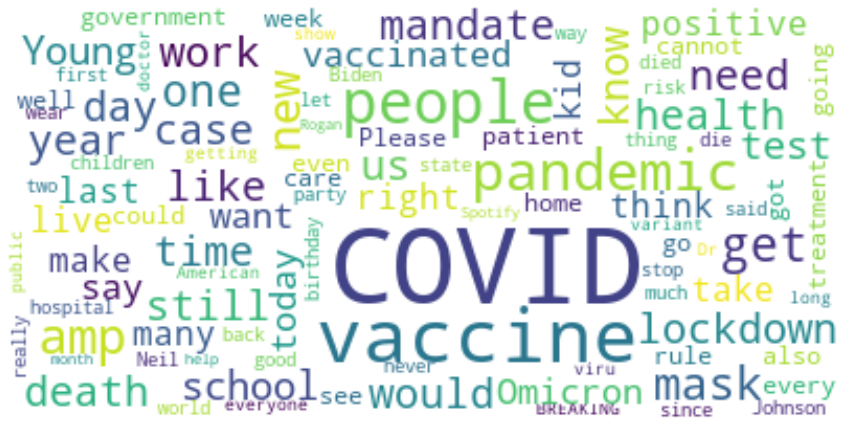

Positive Wordcloud
There are 127003598 words in the combination of all tweets
Ten most frequent words: ['COVID', 'vaccine', 'pandemic', 'people', 'amp', 'get', 'mask', 'new', 'like', 'us']


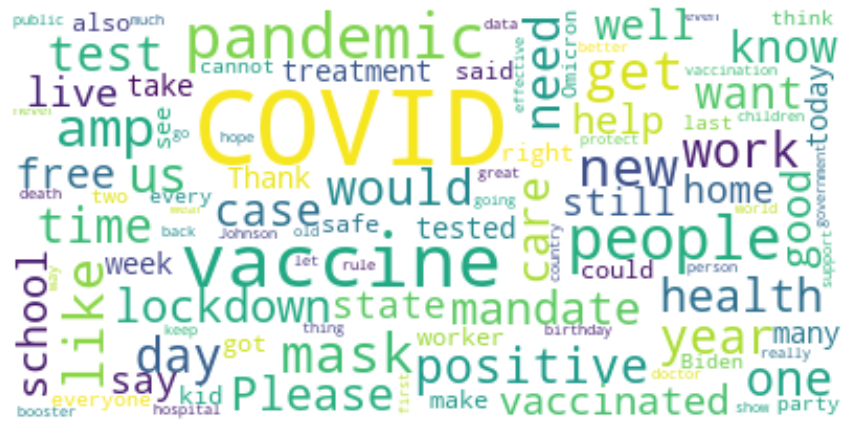

Negative Wordcloud
There are 142551848 words in the combination of all tweets
Ten most frequent words: ['Covid', 'vaccine', 'people', 'pandemic', 'amp', 'death', 'get', 'one', 'day', 'new']


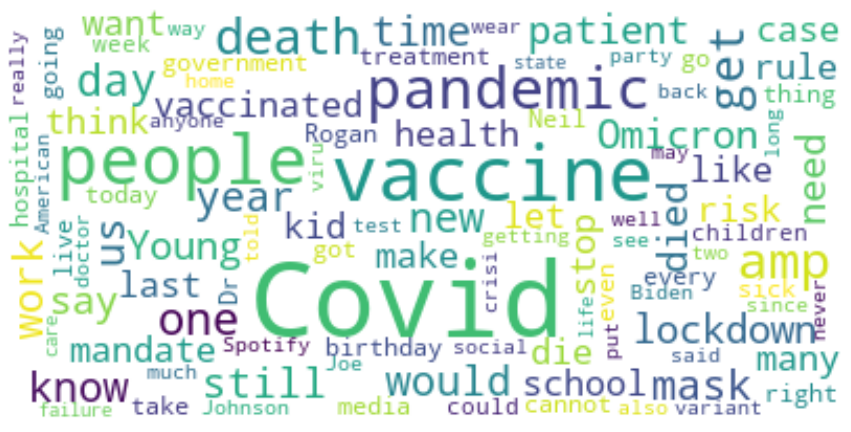

Neutral Wordcloud
There are 29903232 words in the combination of all tweets
Ten most frequent words: ['COVID', 'vaccine', 'Young', 'pandemic', 'new', 'mask', 'death', 'case', 'people', 'Neil']


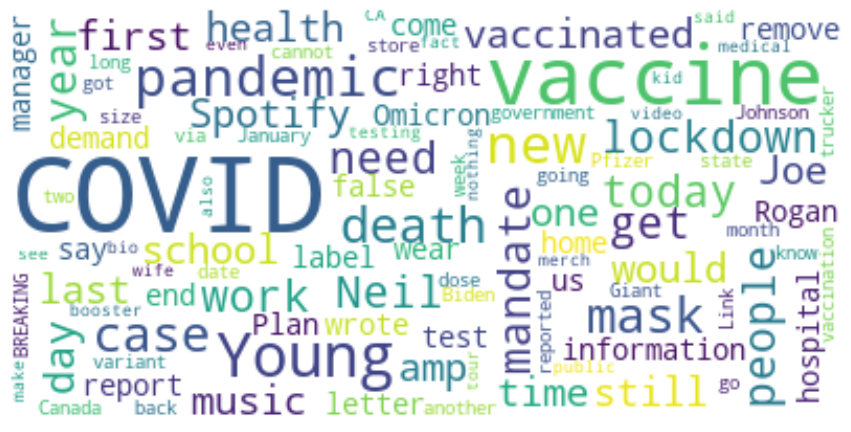

In [ ]:
# generate wordcloud for tweet
print("Overall Wordcloud")
tweet_wc = wordcloud(cleaned_tweets, 'text').to_image()

print("Positive Wordcloud")
tweet_wc_pos = wordcloud(cleaned_tweets.loc[cleaned_tweets['sentiment'] == 1], 'text').to_image()

print("Negative Wordcloud")
tweet_wc_neg = wordcloud(cleaned_tweets.loc[cleaned_tweets['sentiment'] == -1], 'text').to_image()

print("Neutral Wordcloud")
tweet_wc_neu = wordcloud(cleaned_tweets.loc[cleaned_tweets['sentiment'] == 0], 'text').to_image()

Overall Wordcloud
There are 4626726 words in the combination of all tweets
Ten most frequent words: ['COVID19', 'COVID', 'Omicron', 'coronavirus', 'TREASURE', 'JustinFlation', 'vaccine', 'Yoshi', 'iKON', 'Junhoe']


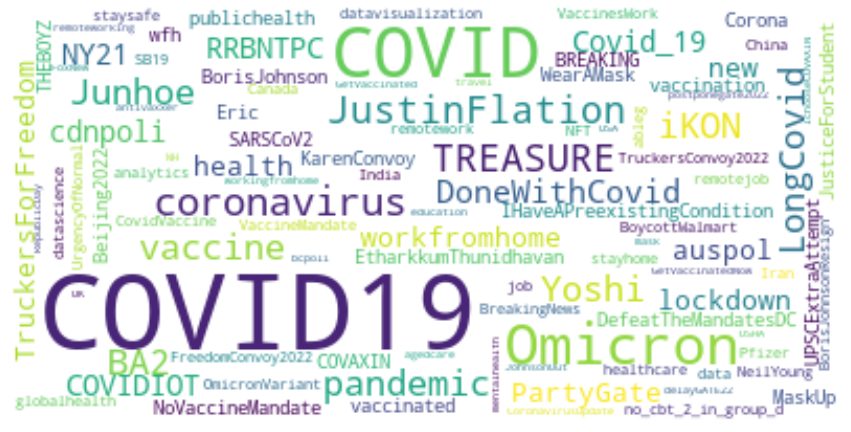

Positive Wordcloud
There are 2087414 words in the combination of all tweets
Ten most frequent words: ['COVID19', 'COVID', 'TREASURE', 'Yoshi', 'iKON', 'Junhoe', 'Omicron', 'RRBNTPC', 'vaccine', 'coronavirus']


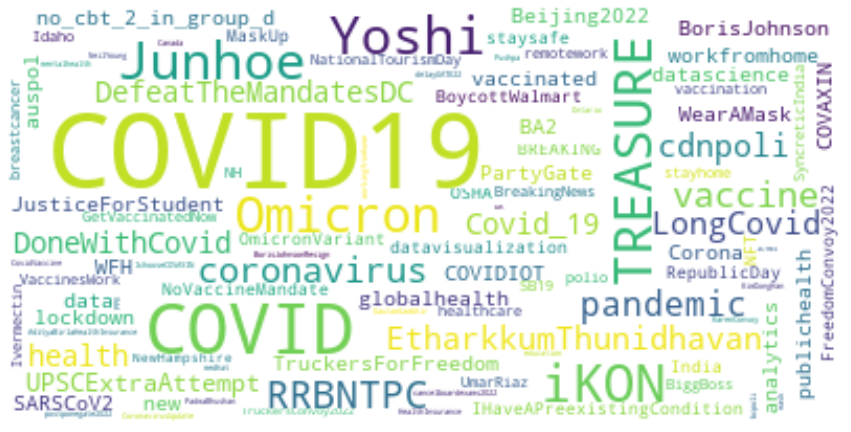

Negative Wordcloud
There are 1411129 words in the combination of all tweets
Ten most frequent words: ['COVID19', 'COVID', 'Omicron', 'JustinFlation', 'BA2', 'NY21', 'LongCovid', 'coronavirus', 'DoneWithCovid', 'vaccine']


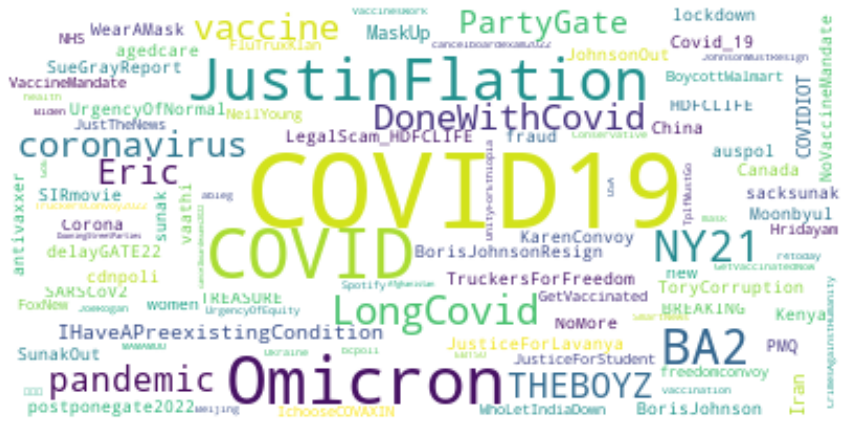

Neutral Wordcloud
There are 1128181 words in the combination of all tweets
Ten most frequent words: ['COVID19', 'COVID', 'Omicron', 'coronavirus', 'vaccine', 'pandemic', 'workfromhome', 'new', 'wfh', 'remotejob']


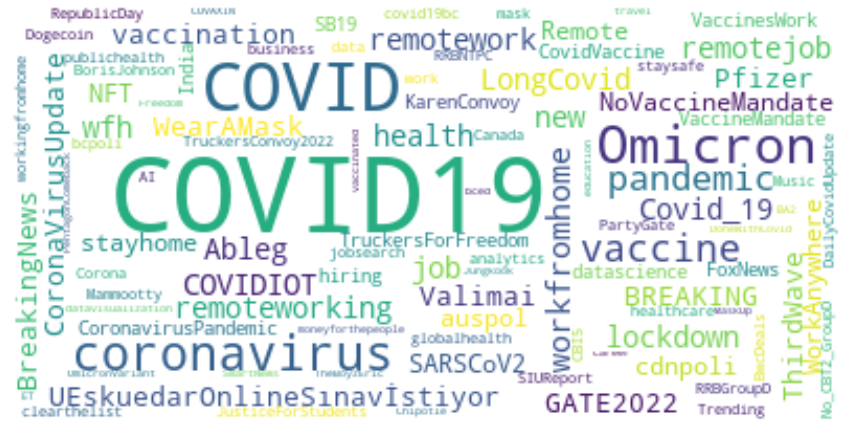

In [ ]:
# generate wordcloud for hashtags
hashtags_df = cleaned_tweets.loc[cleaned_tweets['hashtags'].notnull()]

print("Overall Wordcloud")
hash_wc = wordcloud(hashtags_df, 'hashtags').to_image()

print("Positive Wordcloud")
hash_wc_pos = wordcloud(hashtags_df.loc[hashtags_df['sentiment'] == 1], 'hashtags').to_image()

print("Negative Wordcloud")
hash_wc_neg = wordcloud(hashtags_df.loc[hashtags_df['sentiment'] == -1], 'hashtags').to_image()

print("Neutral Wordcloud")
hash_wc_neu = wordcloud(hashtags_df.loc[hashtags_df['sentiment'] == 0], 'hashtags').to_image()

# Data Transformation

In [ ]:
tweets_df = pd.read_pickle('/content/drive/MyDrive/corona_tweets/corona_tweets_678_idx_preprocessed.pkl')
tweets_df['text'].head()

0                             [want, let, covid, need]
1    [ivermectin, smuggled, chocolate, bar, save, b...
2    [sitting, telling, brother, thing, done, life,...
3    [one, respected, medical, journal, world, go, ...
4    [degree, right, furnace, cranked, right, heati...
Name: text, dtype: object

In [ ]:
# create dictionary
id2word = corpora.Dictionary(tweets_df['text'])

In [ ]:
# create corpus
tweets_df = tweets_df['text'].values.tolist()
print(tweets_df[:1])

[['want', 'let', 'covid', 'need']]


In [ ]:
# term document frequency
corpus = [id2word.doc2bow(text) for text in tweets_df]
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1)]]


# Topic Modelling

Choosing the optimal number of topics

In [ ]:
model_results = {}

In [ ]:
def compute_coherence_values(corpus, dictionary, k):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=tweets_df, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [ ]:
# training 
num_topics = 11
cv = compute_coherence_values(corpus=corpus, dictionary=id2word, k=num_topics)
model_results[num_topics] = cv

In [ ]:
# save the coherence value of each number of topic 
print(model_results.items())
with open('/content/drive/MyDrive/corona_tweets/model_result_second.txt', 'w') as f:
     f.write(json.dumps(model_results))

dict_items([('2', 0.3342524446862815), ('3', 0.31616417315553785), ('4', 0.32328827945138494), ('5', 0.38003329261292296), ('6', 0.3696128842212405), ('7', 0.3392289815178587), ('8', 0.38090234526040767), ('9', 0.36513338318358507), ('10', 0.3726185982023848), ('11', 0.3681543393158705)])


In [ ]:
# load the coherence values for two round of training and get average
def load_results(path):
  with open(path) as f:
      model_results = json.load(f)
  return model_results

first_results = load_results('/content/drive/MyDrive/corona_tweets/model_result_first.txt')
second_results = load_results('/content/drive/MyDrive/corona_tweets/model_result_second.txt')
final_results = {}
for i in range(2,12):
  final_results[i] = (first_results.get(str(i)) + second_results.get(str(i)))/2
final_results

{2: 0.3179603582725289,
 3: 0.3378631642017198,
 4: 0.293966757711433,
 5: 0.3309800108855157,
 6: 0.37208882204836047,
 7: 0.33699465554696756,
 8: 0.3711331485697161,
 9: 0.35766330053211515,
 10: 0.36062381660445086,
 11: 0.35940349127835786}

In [ ]:
# plot the coherence value of each number of topic
NumberOfTopics = [2,3,4,5,6,7,8,9,10,11]
C_vScore = []
for i in NumberOfTopics:
  C_vScore.append(final_results.get(i))

fig = px.line(x = NumberOfTopics ,
              y = C_vScore,
              title = 'Topic Coherence Score')
fig.update_layout(xaxis_title="Number of Topics",yaxis_title="Coherence Score",title_x=0.5)
fig.show()

Final Model and Topic Visualization

In [ ]:
# final model 
lda_model = gensim.models.LdaMulticore(corpus=corpus, id2word=id2word, num_topics=6)
doc_lda = lda_model[corpus]

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1068: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(n

[(0,
  '0.021*"vaccine" + 0.019*"request" + 0.019*"young" + 0.015*"testing" + '
  '0.015*"n" + 0.015*"u" + 0.014*"free" + 0.014*"covid" + 0.014*"usage" + '
  '0.013*"neil"'),
 (1,
  '0.047*"covid" + 0.019*"death" + 0.015*"case" + 0.014*"last" + 0.013*"new" + '
  '0.011*"day" + 0.010*"year" + 0.009*"night" + 0.009*"despite" + 0.008*"two"'),
 (2,
  '0.018*"vaccine" + 0.016*"omicron" + 0.016*"pandemic" + 0.011*"covid" + '
  '0.010*"amp" + 0.009*"antibody" + 0.009*"work" + 0.008*"variant" + '
  '0.008*"monoclonal" + 0.007*"know"'),
 (3,
  '0.044*"tested" + 0.040*"covid" + 0.038*"positive" + 0.027*"soon" + '
  '0.022*"test" + 0.022*"last" + 0.021*"get" + 0.021*"home" + 0.020*"day" + '
  '0.015*"came"'),
 (4,
  '0.039*"covid" + 0.030*"vaccine" + 0.017*"people" + 0.014*"get" + '
  '0.011*"mask" + 0.010*"mandate" + 0.008*"like" + 0.008*"would" + '
  '0.008*"school" + 0.007*"need"'),
 (5,
  '0.022*"covid" + 0.021*"care" + 0.015*"day" + 0.015*"need" + 0.013*"health" '
  '+ 0.012*"pay" + 0.012*"w

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.

/usr/local/lib/python3.7/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin in

In [ ]:
# save the model
lda_model.save('/content/drive/MyDrive/corona_tweets/models')

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:494: DeprecationWarning:

This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:494: DeprecationWarning:

This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:494: DeprecationWarning:

This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information



In [ ]:
# print the keyword in each topic
pprint(lda_model.print_topics())

[(0,
  '0.021*"vaccine" + 0.019*"request" + 0.019*"young" + 0.015*"testing" + '
  '0.015*"n" + 0.015*"u" + 0.014*"free" + 0.014*"covid" + 0.014*"usage" + '
  '0.013*"neil"'),
 (1,
  '0.047*"covid" + 0.019*"death" + 0.015*"case" + 0.014*"last" + 0.013*"new" + '
  '0.011*"day" + 0.010*"year" + 0.009*"night" + 0.009*"despite" + 0.008*"two"'),
 (2,
  '0.018*"vaccine" + 0.016*"omicron" + 0.016*"pandemic" + 0.011*"covid" + '
  '0.010*"amp" + 0.009*"antibody" + 0.009*"work" + 0.008*"variant" + '
  '0.008*"monoclonal" + 0.007*"know"'),
 (3,
  '0.044*"tested" + 0.040*"covid" + 0.038*"positive" + 0.027*"soon" + '
  '0.022*"test" + 0.022*"last" + 0.021*"get" + 0.021*"home" + 0.020*"day" + '
  '0.015*"came"'),
 (4,
  '0.039*"covid" + 0.030*"vaccine" + 0.017*"people" + 0.014*"get" + '
  '0.011*"mask" + 0.010*"mandate" + 0.008*"like" + 0.008*"would" + '
  '0.008*"school" + 0.007*"need"'),
 (5,
  '0.022*"covid" + 0.021*"care" + 0.015*"day" + 0.015*"need" + 0.013*"health" '
  '+ 0.012*"pay" + 0.012*"w

In [ ]:
# compute the coherence value of the model
coherence_model_lda = CoherenceModel(model=lda_model, texts=tweets_df, dictionary=id2word, coherence='c_v')
print(coherence_model_lda.get_coherence())

0.41600614962720367


In [ ]:
# visualize the topics  
pyLDAvis.enable_notebook()
# lda_model =  gensim.models.LdaModel.load('/content/drive/MyDrive/corona_tweets/models')
# if 1 == 1:
#     LDAvis_prepared = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
#     with open('/content/drive/MyDrive/corona_tweets/results', 'wb') as f:
#         pickle.dump(LDAvis_prepared, f)

# load the pre-prepared pyLDAvis data from disk
with open('/content/drive/MyDrive/corona_tweets/results', 'rb') as f:
    LDAvis_prepared = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, '/content/drive/MyDrive/corona_tweets/results'+'.html')
LDAvis_prepared

# topic 1: chidren health and medical care 
# topic 2: covid and death case
# topic 3: public messaging error
# topic 4: workplace
# topic 5: misinformation spreading
# topic 6: quarantining subject

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:494: DeprecationWarning:

This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:494: DeprecationWarning:

This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:494: DeprecationWarning:

This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:247: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4      0.043197  0.140602       1        1  33.736795
1     -0.084766  0.120763       2        1  21.245281
2      0.131013  0.227744       3        1  19.142323
5     -0.157322 -0.020985       4        1   9.680983
0      0.311388 -0.257648       5        1   8.168885
3     -0.243509 -0.210475       6        1   8.025733, topic_info=         Term           Freq          Total Category  logprob  loglift
215    tested  103128.000000  103128.000000  Default  30.0000  30.0000
54    vaccine  446731.000000  446731.000000  Default  29.0000  29.0000
211  positive   89213.000000   89213.000000  Default  28.0000  28.0000
69       last  134629.000000  134629.000000  Default  27.0000  27.0000
100       day  157769.000000  157769.000000  Default  26.0000  26.0000
..        ...            ...            ...      ...      ...      ...
0       covid   92517.068747  916535.828554   Topic6  -3.2223   0.2293
274      well   26780.370350   76688.305814   Topic6  -4.4620   1.4704
951     staff   17153.901526   27733.124612   Topic6  -4.9074   2.0421
122       see   20638.458641   74625.398713   Topic6  -4.7225   1.2372
44        one   17951.656354  121410.389284   Topic6  -4.8620   0.6110

[381 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
2438      4  0.999926       aged
6835      3  0.999951     agreed
709       4  0.000051        aid
709       5  0.999930        aid
7001      3  0.999942       alex
...     ...       ...        ...
75        4  0.140973       year
75        5  0.050604       year
75        6  0.028420       year
373       5  0.999981      young
7852      6  0.999950  younghoon

[628 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 2, 3, 6, 1, 4])

In [ ]:
# plot heatmap for topic correlation
lda_model =  gensim.models.LdaModel.load('/content/drive/MyDrive/corona_tweets/models')
label = ['misinformation spreading','covid and death case','public messaging error','quarantining subject','chidren health and medical care','workplace']
mdiff, annotation = lda_model.diff(lda_model, distance='jaccard', num_words=50)
annotation_html = None
if annotation is not None:
    annotation_html = [
        [
            "+++ {}<br>--- {}".format(", ".join(int_tokens), ", ".join(diff_tokens))
            for (int_tokens, diff_tokens) in row
        ]
        for row in annotation
    ]
topic_heatmap = go.Figure(data = go.Heatmap(z=mdiff,x=label,y=label,colorscale='RdBu', text=annotation_html))
topic_heatmap.update_layout(width=700, height=600,xaxis=dict(title="topic"), yaxis=dict(title="topic"))
topic_heatmap.update_layout(title="Correlation of Topics",title_x=0.5)
topic_heatmap.show()

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:494: DeprecationWarning:

This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:494: DeprecationWarning:

This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:494: DeprecationWarning:

This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information



# Dashboard

In [ ]:
# define drop down list for dashboard
ticker_dict = [
    {'label': 'All', 'value': 'all'},
    {'label': 'Positive', 'value': 'pos'},
    {'label': 'Negative', 'value': 'neg'},
    {'label': 'Neutral', 'value': 'neu'}
]

In [ ]:
# create dash app for dashboard

# !pip install dash
# !pip install dash-bootstrap-components
# !pip install jupyter_dash==0.4.2
# import dash
# import dash_core_components as dcc
# import dash_html_components as html
# from dash.dependencies import Output, Input
# import plotly.express as px
# import dash_bootstrap_components as dbc
# import plotly.graph_objects as go
# import dash_table
# from jupyter_dash import JupyterDash
# import base64
# from io import BytesIO

app = JupyterDash(__name__, external_stylesheets=[dbc.themes.FLATLY])
with BytesIO() as buffer:
    tweet_wc.save(buffer, 'png')
    img_tweet_wc = base64.b64encode(buffer.getvalue()).decode()
with BytesIO() as buffer:    
    hash_wc.save(buffer, 'png')
    img_hash_wc = base64.b64encode(buffer.getvalue()).decode()   


app.layout = dbc.Container(
    [  
        dbc.Row([  # start of first row
                 
            dbc.Col([  # first column on first row
            html.H5('Select the sentiment', className='text-center'),
                dcc.Dropdown(
                    id='ticker-selector',
                    options=ticker_dict,
                    value='all',
                    clearable=False, style={'height': '30px', 'width': '300px'}
                ),
            html.Hr(),
            ], width={'size': 3, 'offset': 0, 'order': 2}),  # width first column on first row

            dbc.Col([  # second column on first row
            html.H2('COVID TWEETS ON 25 JANUARY 2022', className='text-center text-primary, mb-3',style={'height': '60px'}),
            html.Hr(),
            ], width={'size': 9, 'offset': 0, 'order': 1}),  # width second column on first row
          ]
        ),  # end of first row 
     
        dbc.Row([  # start of second row
            dbc.Col([  # first column on second row
            html.H5('Counts of Sentiment', className='text-center'),
            dcc.Graph(id='chart_sentiment_donut',
                      figure=sentiment_donut,
                      style={'height':650}),
            html.Hr(),
            ], width={'size': 6, 'offset': 0, 'order': 1}),  # width first column on second row

            dbc.Col([  # second column on second row
            html.H5('Correlation of Topics', className='text-center'),
            dcc.Graph(id='chart_topic_heatmap',
                      figure=topic_heatmap,
                      style={'height':650}),
            html.Hr(),
            ], width={'size': 6, 'offset': 0, 'order': 2}),  # width first column on second row
          ]
        ),  # end of second row

        dbc.Row([  # start of third row
            dbc.Col([  # first column on third row
            html.H5('Tweet Length', className='text-center'),
            dcc.Graph(id='chrt-length_histogram',
                      figure=length_histogram,
                      style={'height':550}),
            html.Hr(),
            ], width={'size': 12, 'offset': 0, 'order': 1}),  # width first column on third row
          ]
        ),  # end of third row    
     
        dbc.Row([  # start of forth row
            dbc.Col([  # second column on forth row
            html.H5('Tweet Wordcloud', className='text-center'),
            html.Div(children=[
                    html.Img(id='wc-tweets',src="data:image/png;base64," + img_tweet_wc, style={'height':'100%', 'width':'100%'})
                ]),          
            html.Hr(),
            ], width={'size': 6, 'offset': 0, 'order': 1}),  # width second column on forth row

            dbc.Col([  # second column on second row
            html.H5('Hashtags Wordcloud', className='text-center'),
            html.Div(children=[
                    html.Img(id='wc-hash',src="data:image/png;base64," + img_hash_wc, style={'height':'100%', 'width':'100%'})
                ]),          
            html.Hr(),
            ], width={'size':6, 'offset': 0, 'order': 2}),  # width second column on forth row
          ]
        ),  # end of forth row
        
    ])

@app.callback(
    [Output("chrt-length_histogram","figure"),Output("wc-tweets","src"),Output("wc-hash","src")],
    [Input("ticker-selector","value")]
)

def render_tickerchart(value):
  if value == 'neu':
    chrt_length = length_histogram_neu
    with BytesIO() as buffer:    
      tweet_wc_neu.save(buffer, 'png')
      img_tweet_wc = base64.b64encode(buffer.getvalue()).decode()   
    wc = "data:image/png;base64," + img_tweet_wc
    with BytesIO() as buffer:    
      hash_wc_neu.save(buffer, 'png')
      img_hash_wc = base64.b64encode(buffer.getvalue()).decode()   
    wc_h = "data:image/png;base64," + img_hash_wc
  elif value == 'pos':
    chrt_length = length_histogram_pos
    with BytesIO() as buffer:    
      tweet_wc_pos.save(buffer, 'png')
      img_tweet_wc = base64.b64encode(buffer.getvalue()).decode()   
    wc = "data:image/png;base64," + img_tweet_wc
    with BytesIO() as buffer:    
      hash_wc_pos.save(buffer, 'png')
      img_hash_wc = base64.b64encode(buffer.getvalue()).decode()   
    wc_h = "data:image/png;base64," + img_hash_wc
  elif value == 'neg':
    chrt_length = length_histogram_neg
    with BytesIO() as buffer:    
      tweet_wc_neg.save(buffer, 'png')
      img_tweet_wc = base64.b64encode(buffer.getvalue()).decode()   
    wc = "data:image/png;base64," + img_tweet_wc
    with BytesIO() as buffer:    
      hash_wc_neg.save(buffer, 'png')
      img_hash_wc = base64.b64encode(buffer.getvalue()).decode()   
    wc_h = "data:image/png;base64," + img_hash_wc
  else:
    chrt_length = length_histogram
    with BytesIO() as buffer:    
      tweet_wc.save(buffer, 'png')
      img_tweet_wc = base64.b64encode(buffer.getvalue()).decode()   
    wc = "data:image/png;base64," + img_tweet_wc
    with BytesIO() as buffer:    
      hash_wc.save(buffer, 'png')
      img_hash_wc = base64.b64encode(buffer.getvalue()).decode()   
    wc_h = "data:image/png;base64," + img_hash_wc
  return chrt_length,wc,wc_h

if __name__ == "__main__":
    app.run_server(debug=True, port=3777)

Dash app running on:


<IPython.core.display.Javascript object>

In [ ]:
# restart kernel 

import os
if not os.getenv("IS_TESTING"):
    import IPython

    app = IPython.Application.instance()
    app.kernel.do_shutdown(True)